<a href="https://colab.research.google.com/github/joneswinslet/debit-card-fraud-detection/blob/main/Debit_card_fraud_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [6]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime
from math import sqrt
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

In [8]:
MA_Data = pd.read_csv('/Mastercard_stock_history.csv')

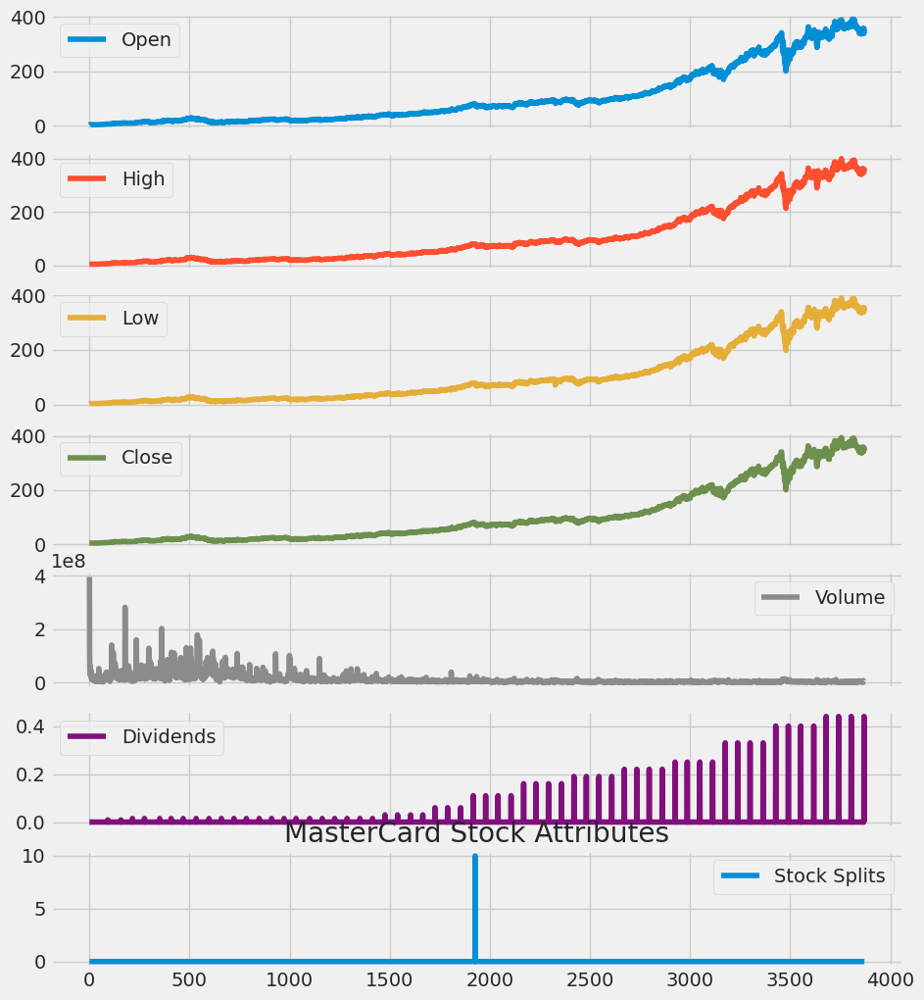

In [9]:
MA_Data.plot(subplots = True, figsize = (10,12))
plt.title('MasterCard Stock Attributes')
plt.show()

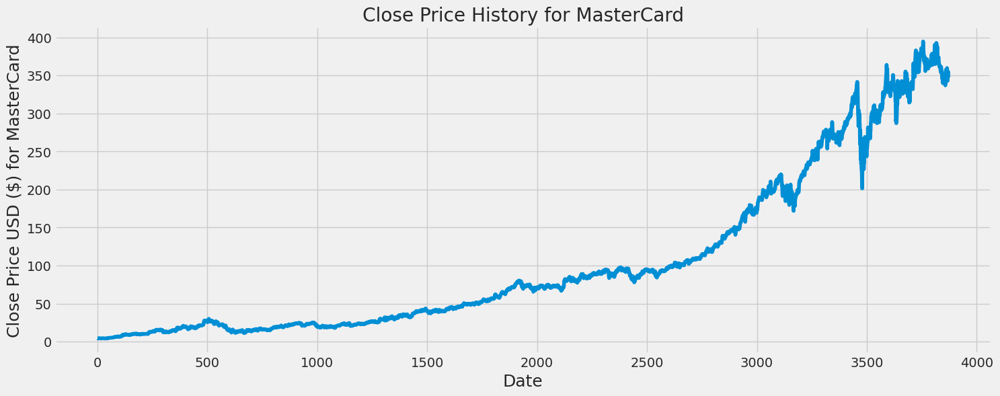

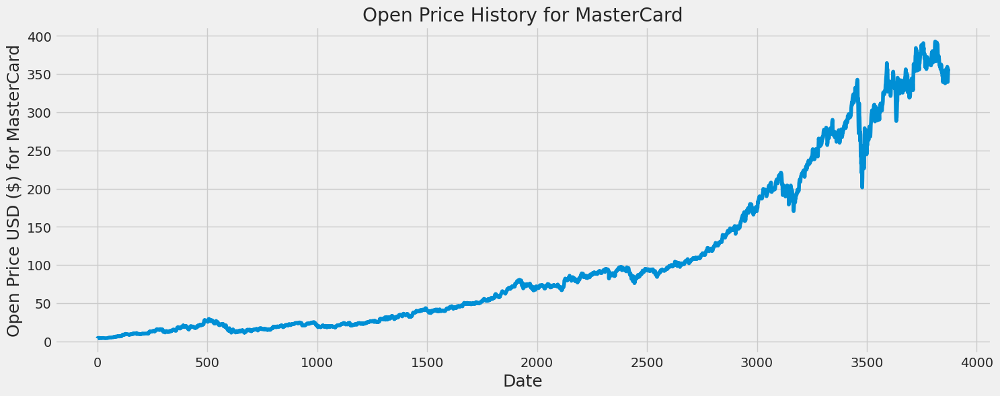

In [10]:
def plot_close_val(data_frame, column, stock):
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock )
    plt.plot(data_frame[column])
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' Price USD ($) for ' + stock, fontsize=18)
    plt.show()

#Test the function
plot_close_val(MA_Data, 'Close', 'MasterCard')
plot_close_val(MA_Data, 'Open',  'MasterCard')

In [12]:
ma_info =  pd.read_csv('/Mastercard_stock_history.csv',
                         header=None,
                         names=(['Description','Information']))
#ma_info.dropna()
ma_info.drop(ma_info.loc[ma_info['Information']=='nan'].index, inplace=True)
ma = ma_info.sort_values('Information').style
ma

,,,,,,Description,Information
2014-02-03,72.46498438615183,72.80801446585315,70.36868864689448,70.42586517333984,9828200,0.0,0.0
2016-08-12,93.07581586079631,93.51229505633862,92.6393440653387,93.23101043701172,1988600,0.0,0.0
2016-08-15,93.41531488313737,93.65780091068167,93.182530368719,93.54141235351562,2081200,0.0,0.0
2016-08-16,93.30860219407592,93.36680386136486,92.5908457649142,92.74604034423828,2866200,0.0,0.0
2016-08-17,92.9109197795378,93.18250286621678,92.17376040134909,92.71692657470703,4054700,0.0,0.0
2016-08-18,92.4356444462271,92.98851210035103,92.21255412259504,92.40653991699219,3134200,0.0,0.0
2016-08-19,92.31927172489077,92.42596615864144,91.57241808872162,92.35807037353516,3090800,0.0,0.0
2016-08-22,92.32896196043154,93.06611399438579,92.09617009699735,92.91092681884766,2390800,0.0,0.0
2016-08-23,93.11461229895784,93.85177171834826,93.10491078815303,93.3958969116211,3099700,0.0,0.0
2016-08-24,93.39588890945319,93.57047908855823,92.52293801392807,92.65872955322266,2008100,0.0,0.0


<Axes: >

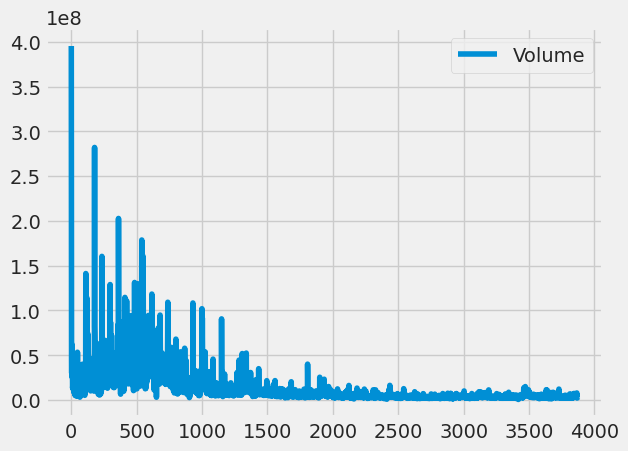

In [13]:
MA_Data[["Volume"]].plot()


In [14]:
MA_Data = pd.read_csv('/Mastercard_stock_history.csv', header=0,
                      index_col= 0, names=['Date','Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Splits'],
                      parse_dates=True)
# Get the number of days in `ma`
days = (MA_Data.index[-1] - MA_Data.index[0]).days

# Calculate the CAGR
cagr = ((((MA_Data['Close'][-1]) / MA_Data['Close'][1])) ** (365.0/days)) - 1


# Print CAGR
print("The CAGR (Compound Annual Growth Rate) of Mastercard since IPO is " , round((cagr*100),2), "% per year")

The CAGR (Compound Annual Growth Rate) of Mastercard since IPO is  33.26 % per year


In [15]:
adj_close_px = MA_Data['Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

Date
2021-09-28    354.386739
2021-09-29    354.026943
2021-09-30    353.519334
2021-10-01    353.225706
2021-10-04    352.468413
2021-10-05    351.782529
2021-10-06    351.304383
2021-10-07    351.057624
2021-10-08    350.893543
2021-10-11    350.514987
Name: Close, dtype: float64

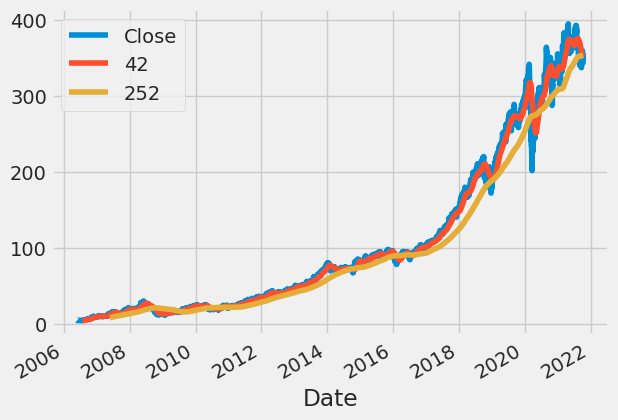

In [16]:
MA_Data['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
MA_Data['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, the short and long windows of rolling means
MA_Data[['Close', '42', '252']].plot()

plt.show()

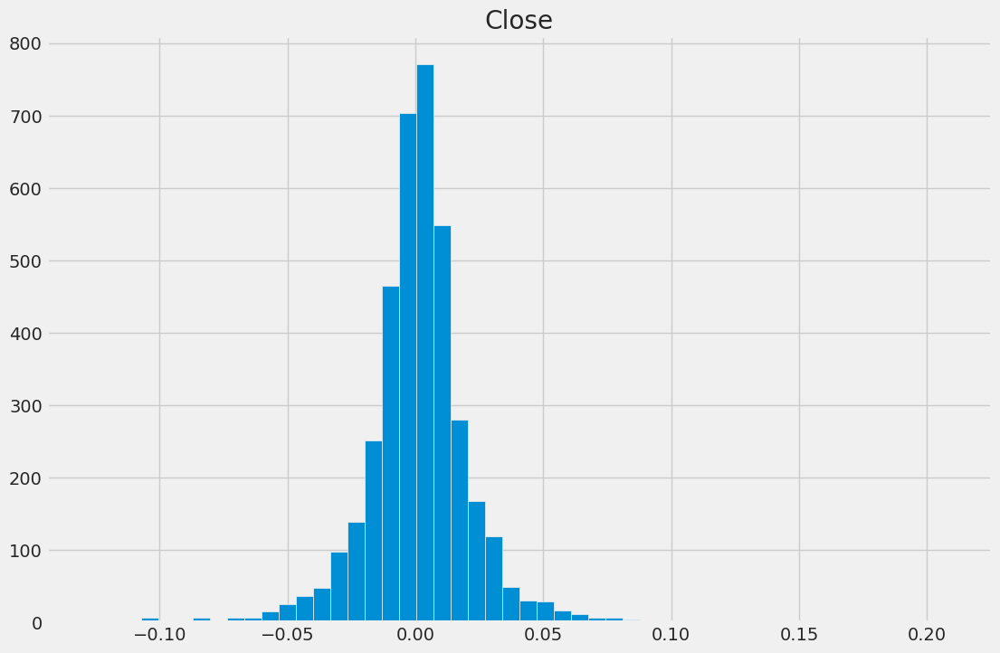

In [17]:
daily_close_px = MA_Data[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

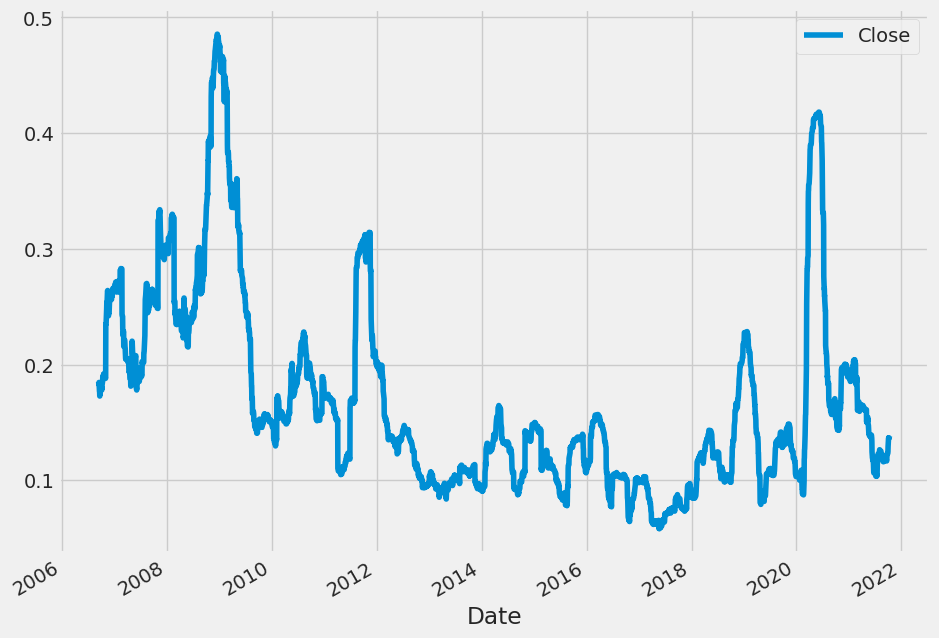

In [18]:
# Define the minumum of periods to consider
min_periods = 75

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods)

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

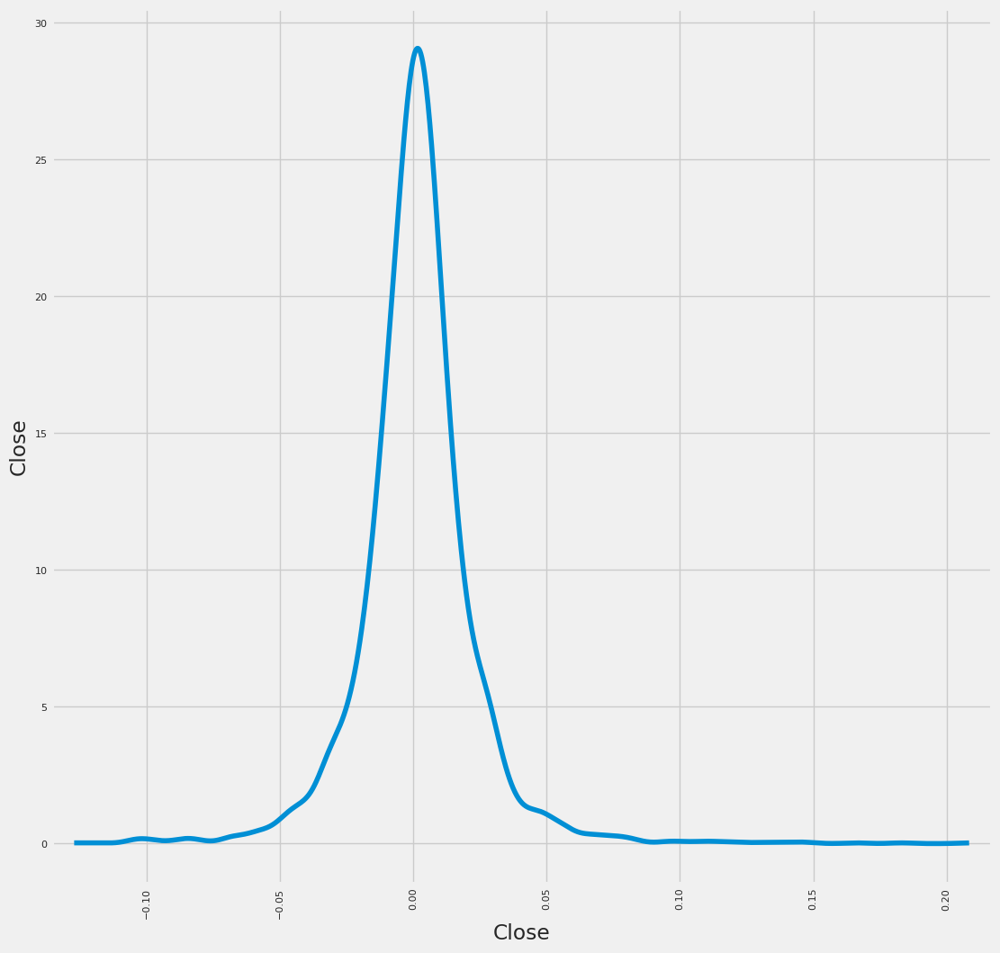

In [19]:
# Plot a scatter matrix with the `daily_pct_change` data
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

In [20]:
import plotly.graph_objects as go

MA_Data=MA_Data.reset_index()

fig = go.Figure(data=go.Ohlc(x=MA_Data['Date'],
        open=MA_Data['Open'],
        high=MA_Data['High'],
        low=MA_Data['Low'],
        close=MA_Data['Close']))
fig.show()


In [21]:
MA_Data=MA_Data.reset_index()

MA_Data['SMA5'] = MA_Data.Close.rolling(5).mean()
MA_Data['SMA20'] = MA_Data.Close.rolling(20).mean()
MA_Data['SMA50'] = MA_Data.Close.rolling(50).mean()
MA_Data['SMA200'] = MA_Data.Close.rolling(200).mean()
MA_Data['SMA500'] = MA_Data.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x=MA_Data['Date'],open=MA_Data['Open'],high=MA_Data['High'],low=MA_Data['Low'],close=MA_Data['Close'], name = "OHLC"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA5, line=dict(color='orange', width=1), name="SMA5"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA20, line=dict(color='green', width=1), name="SMA20"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA50, line=dict(color='blue', width=1), name="SMA50"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA200, line=dict(color='violet', width=1), name="SMA200"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA500, line=dict(color='purple', width=1), name="SMA500")])
fig.show()

In [22]:
MA_Data['EMA5'] = MA_Data.Close.ewm(span=5, adjust=False).mean()
MA_Data['EMA20'] = MA_Data.Close.ewm(span=20, adjust=False).mean()
MA_Data['EMA50'] = MA_Data.Close.ewm(span=50, adjust=False).mean()
MA_Data['EMA200'] = MA_Data.Close.ewm(span=200, adjust=False).mean()
MA_Data['EMA500'] = MA_Data.Close.ewm(span=500, adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=MA_Data['Date'],
                              open=MA_Data['Open'],
                              high=MA_Data['High'],
                              low=MA_Data['Low'],
                              close=MA_Data['Close'], name = "OHLC"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA5, line=dict(color='orange', width=1), name="EMA5"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA20, line=dict(color='green', width=1), name="EMA20"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA50, line=dict(color='blue', width=1), name="EMA50"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA200, line=dict(color='violet', width=1), name="EMA200"),
                      go.Scatter(x=MA_Data.Date, y=MA_Data.SMA500, line=dict(color='purple', width=1), name="EMA500")])
fig.show()

In [23]:
MA_Data.set_index('Date')

,index,Open,High,Low,Close,Volume,Dividends,Splits,42,252,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500
Date,,,,,,,,,,,,,,,,,,,,
2006-05-25,0,3.748967,4.283869,3.739664,4.279217,395343000,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.279217,4.279217,4.279217,4.279217,4.279217
2006-05-26,1,4.307126,4.348058,4.103398,4.179680,103044000,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.246038,4.269737,4.275314,4.278227,4.278820
2006-05-30,2,4.183400,4.184330,3.986184,4.093164,49898000,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.195080,4.252921,4.268171,4.276385,4.278079
2006-05-31,3,4.125723,4.219679,4.125723,4.180608,30002000,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.190256,4.246034,4.264737,4.275432,4.277690
2006-06-01,4,4.179678,4.474572,4.176887,4.419686,62344000,0.00,0.0,NaN,NaN,4.230471,NaN,NaN,NaN,NaN,4.266733,4.262572,4.270813,4.276868,4.278256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-05,3867,347.121403,348.130138,342.497241,342.776886,4724100,0.00,0.0,351.782529,353.264527,349.250726,347.894441,356.860313,359.588689,324.678704,347.753324,349.375773,354.931623,354.580376,323.751065
2021-10-06,3868,339.580960,348.439763,338.682072,348.250000,3712000,0.00,0.0,351.304383,353.315549,348.351862,347.777089,356.029763,359.636595,324.829022,347.918882,349.268556,354.669598,354.517387,323.848865
2021-10-07,3869,349.000000,357.899994,349.000000,353.910004,3209200,0.44,0.0,351.057624,353.363513,349.685608,347.924261,355.448840,359.742456,324.989730,349.915923,349.710599,354.639810,354.511343,323.968870


In [24]:
MA_Data = MA_Data.set_index('Date')
MA_Data.index
x = MA_Data['Open'].resample('MS').mean()
x.head()

Date
2006-05-01    4.091304
2006-06-01    4.349791
2006-07-01    4.267356
2006-08-01    4.928380
2006-09-01    5.859737
Freq: MS, Name: Open, dtype: float64

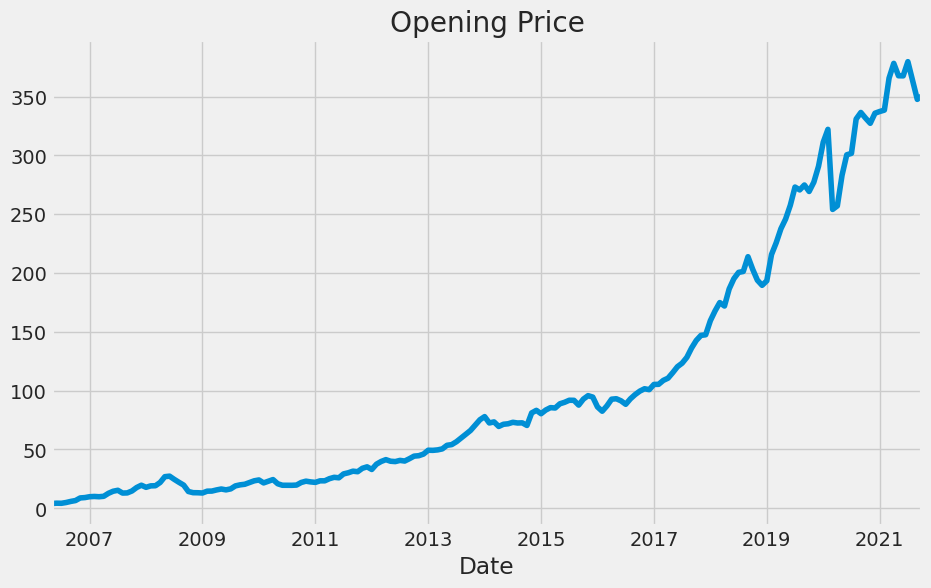

In [25]:
#visualize time series of open price
x.plot(figsize = (10,6))
plt.title("Opening Price")
plt.show()

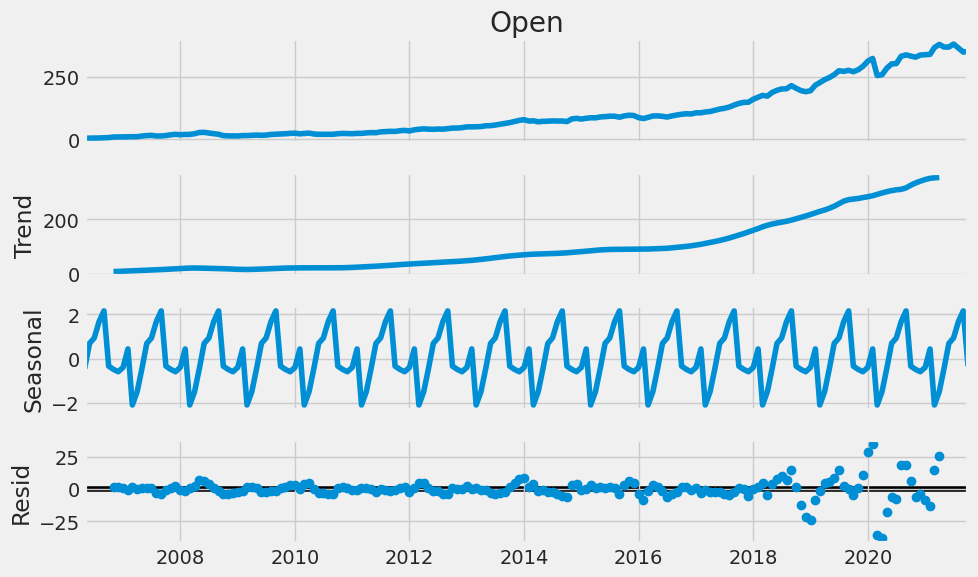

In [26]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 10,6
decomposition = sm.tsa.seasonal_decompose(x, model = 'additive')
fig = decomposition.plot()
plt.show()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

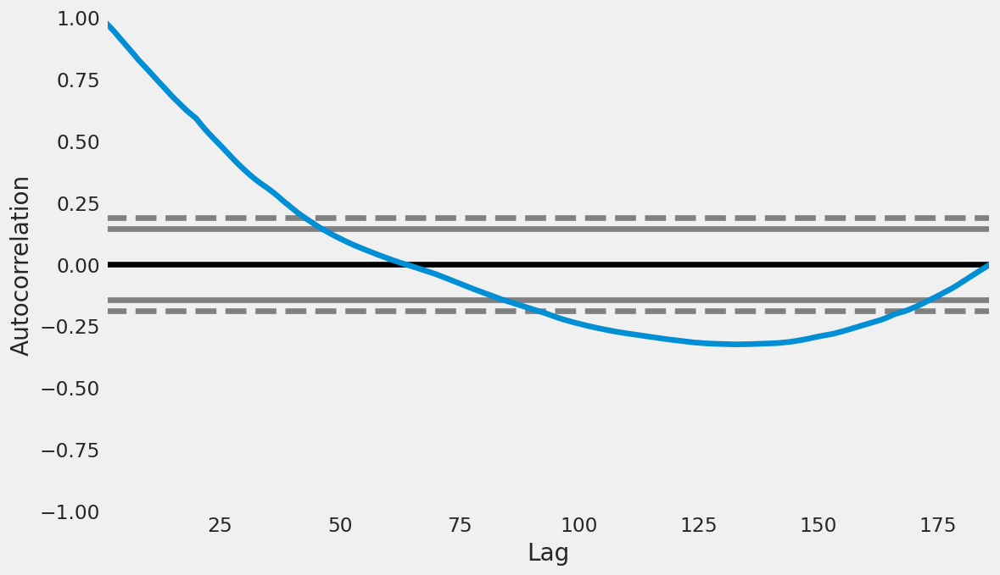

In [27]:
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller, kpss
plt.rcParams.update({'figure.figsize':(10,6), 'figure.dpi':120})
autocorrelation_plot(x.tolist())

In [28]:
import warnings
import itertools

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [29]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            model = sm.tsa.statespace.SARIMAX(x, order = param, seasonal_order = param_seasonal, enforce_stationarity = False,
                                            enforce_invertibility = False)
            results = model.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
                continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2381.974735720722
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2070.4523838114856
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:1734.8516826516266
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1563.3905706863648
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1545.2549797872277


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1494.2451496811734
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1513.4723047709763
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1468.9816514551317
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2128.7962490724685
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:1835.5192031395952
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:1542.6864976288052
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1408.199752049536
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1425.2178574554132
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1356.2860221975625
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1399.2416119630723
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1349.5094706099721
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:1298.2815185802715
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1224.7260869697336
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:1353.020822672203
ARIMA(0, 1, 0)x(0, 1, 1, 12)12 - AIC:1165.2033746950992
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:1230.1825091819092
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:1225.4885647206363
ARIMA(0, 1, 0)x(1, 1, 0, 12)12 - AIC:1170.43089036

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



ARIMA(1, 0, 0)x(0, 0, 1, 12)12 - AIC:1225.9424896278472
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:1356.969929268023
ARIMA(1, 0, 0)x(0, 1, 1, 12)12 - AIC:1171.0742677268959
ARIMA(1, 0, 0)x(1, 0, 0, 12)12 - AIC:1214.0766277572395
ARIMA(1, 0, 0)x(1, 0, 1, 12)12 - AIC:1215.9371047524176
ARIMA(1, 0, 0)x(1, 1, 0, 12)12 - AIC:1172.2334463423654
ARIMA(1, 0, 0)x(1, 1, 1, 12)12 - AIC:1163.1781180669213
ARIMA(1, 0, 1)x(0, 0, 0, 12)12 - AIC:1287.3261357215201
ARIMA(1, 0, 1)x(0, 0, 1, 12)12 - AIC:1208.720971792165
ARIMA(1, 0, 1)x(0, 1, 0, 12)12 - AIC:1344.8948537854226
ARIMA(1, 0, 1)x(0, 1, 1, 12)12 - AIC:1163.9272676115386
ARIMA(1, 0, 1)x(1, 0, 0, 12)12 - AIC:1214.084649237359
ARIMA(1, 0, 1)x(1, 0, 1, 12)12 - AIC:1210.05464495286
ARIMA(1, 0, 1)x(1, 1, 0, 12)12 - AIC:1174.0658855049799
ARIMA(1, 0, 1)x(1, 1, 1, 12)12 - AIC:1157.8113519423157
ARIMA(1, 1, 0)x(0, 0, 0, 12)12 - AIC:1295.4804876688356
ARIMA(1, 1, 0)x(0, 0, 1, 12)12 - AIC:1221.1320830246057
ARIMA(1, 1, 0)x(0, 1, 0, 12)12 - AIC:1353.18436928388

In [30]:
model = sm.tsa.statespace.SARIMAX(x, order = (1, 1, 1), seasonal_order = (1, 1, 0, 12), enforce_stationarity = False,
                                enforce_invertibility = False)
result = model.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3238      0.396     -0.818      0.413      -1.100       0.452
ma.L1          0.4399      0.371      1.187      0.235      -0.286       1.166
ar.S.L12      -0.4898      0.133     -3.674      0.000      -0.751      -0.229
ma.S.L12      -0.6630      0.126     -5.283      0.000      -0.909      -0.417
sigma2        73.7072      2.980     24.730      0.000      67.866      79.549


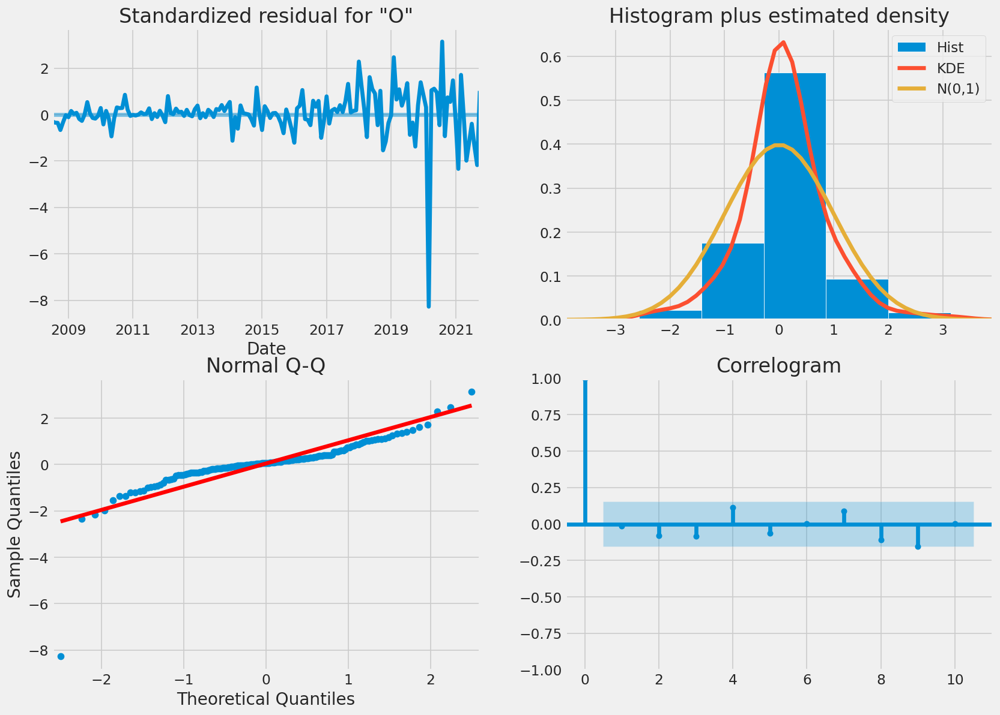

In [31]:
result.plot_diagnostics(figsize = (15, 11))
plt.show()

In [32]:
y_pred = result.get_prediction(start = pd.to_datetime('2019-01-01'), dynamic = False)
pred_ci = y_pred.conf_int()
print(pred_ci)

            lower Open  upper Open
Date                              
2019-01-01  175.862928  211.444910
2019-02-01  175.480365  211.062348
2019-03-01  202.037523  237.619506
2019-04-01  209.957103  245.539085
2019-05-01  224.621254  260.203237
2019-06-01  233.095831  268.677814
2019-07-01  242.999328  278.581310
2019-08-01  260.779034  296.361017
2019-09-01  260.185255  295.767238
2019-10-01  264.026133  299.608116
2019-11-01  255.783139  291.365122
2019-12-01  260.342550  295.924533
2020-01-01  285.658275  321.240258
2020-02-01  301.454066  337.036049
2020-03-01  311.390776  346.972759
2020-04-01  229.805144  265.387127
2020-05-01  255.188153  290.770136
2020-06-01  274.039033  309.621016
2020-07-01  288.048319  323.630301
2020-08-01  284.568782  320.150764
2020-09-01  327.108483  362.690466
2020-10-01  307.151734  342.733716
2020-11-01  304.518067  340.100050
2020-12-01  304.652180  340.234163
2021-01-01  321.903744  357.485727
2021-02-01  341.905692  377.487675
2021-03-01  332.3531

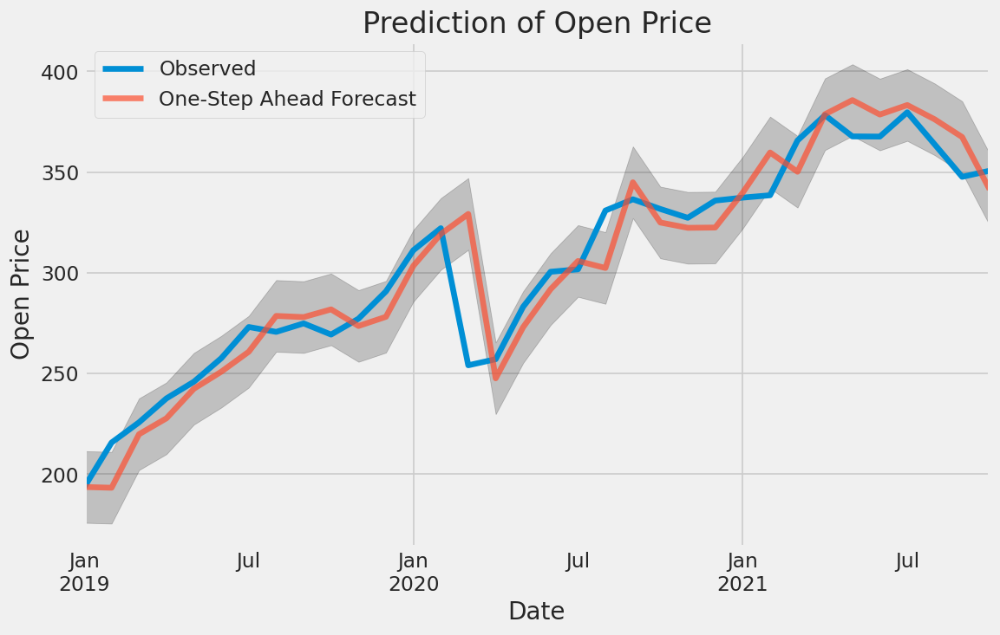

In [33]:
#visualize prediction of open price
ax = x['2019':].plot(label = 'Observed')
y_pred.predicted_mean.plot(ax = ax, label = 'One-Step Ahead Forecast', alpha = .7, figsize = (10, 6))
ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color = 'k', alpha = .2)
plt.title("Prediction of Open Price")
ax.set_xlabel('Date')
ax.set_ylabel('Open Price')
plt.legend()
plt.show()

In [34]:
#prediction of forecast
y_forecasted = y_pred.predicted_mean
y_truth = x['2019-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Mean Squared Error of our forecasts is 298.82
The Root Mean Squared Error of our forecasts is 17.29


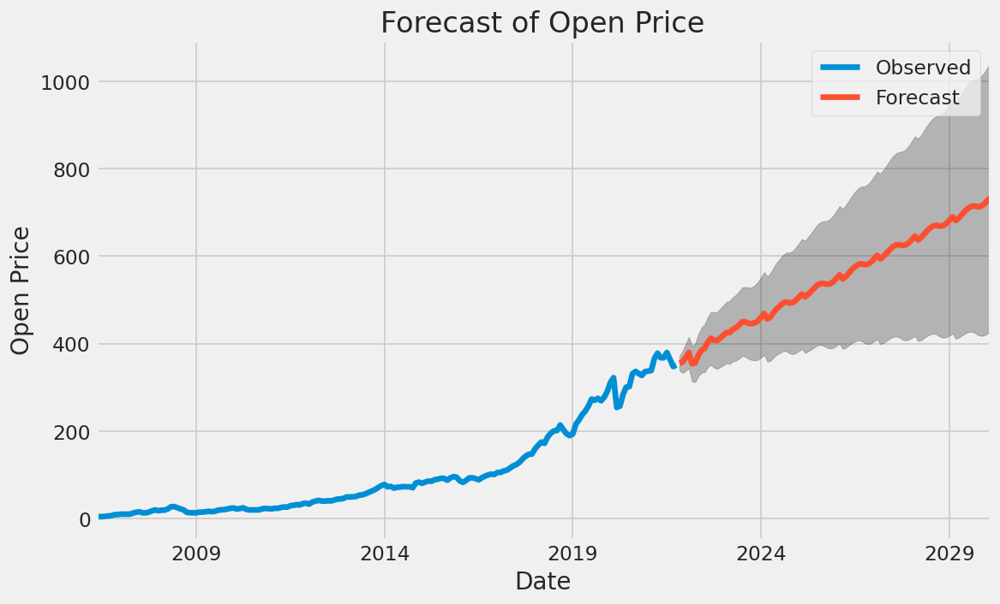

In [35]:
#visualize prediction of forecast
pred_uc = results.get_forecast(steps = 100)
pred_ci = pred_uc.conf_int()
ax = x.plot(label = 'Observed', figsize = (10,6))
pred_uc.predicted_mean.plot(ax = ax, label = 'Forecast')
ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color = 'k', alpha = .25)
plt.title("Forecast of Open Price")
ax.set_xlabel('Date')
ax.set_ylabel('Open Price')
plt.legend()

In [36]:
# ADF Test
result = adfuller(x, autolag = 'AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(x, regression = 'c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: 3.3086672480717096
p-value: 1.0
Critial Values:
   1%, -3.4672111510631
Critial Values:
   5%, -2.877734766803841
Critial Values:
   10%, -2.575403364197531

KPSS Statistic: 1.644787
p-value: 0.010000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


<ipython-input-36-41e03339c6d4>:10: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [58]:
try:
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover
except:
    !pip install finta backtesting
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for backtesting: filename=Backtesting-0.3.3-py3-none-any.whl size=173916 sha256=27628d7fd13dad9eee85877f1ac71af433574322531fb91f427f3d8c520d9a18
  Stored in directory: /root/.cache/pip/wheels/e2/30/7f/19cbe31987c6ebdb47f1f510343249066711609e3da2d57176
Successfully built backtesting


In [60]:
fin_ma = pd.read_csv('/Mastercard_stock_history.csv', index_col="Date", parse_dates=True)
print(fin_ma.head())
ohlc=fin_ma
print(TA.SMA(ohlc, 42))

                Open      High       Low     Close     Volume  Dividends  \
Date                                                                       
2006-05-25  3.748967  4.283869  3.739664  4.279217  395343000        0.0   
2006-05-26  4.307126  4.348058  4.103398  4.179680  103044000        0.0   
2006-05-30  4.183400  4.184330  3.986184  4.093164   49898000        0.0   
2006-05-31  4.125723  4.219679  4.125723  4.180608   30002000        0.0   
2006-06-01  4.179678  4.474572  4.176887  4.419686   62344000        0.0   

            Stock Splits  
Date                      
2006-05-25           0.0  
2006-05-26           0.0  
2006-05-30           0.0  
2006-05-31           0.0  
2006-06-01           0.0  
Date
2006-05-25           NaN
2006-05-26           NaN
2006-05-30           NaN
2006-05-31           NaN
2006-06-01           NaN
                 ...    
2021-10-05    352.751685
2021-10-06    352.137224
2021-10-07    351.749075
2021-10-08    351.453460
2021-10-11    351.05749

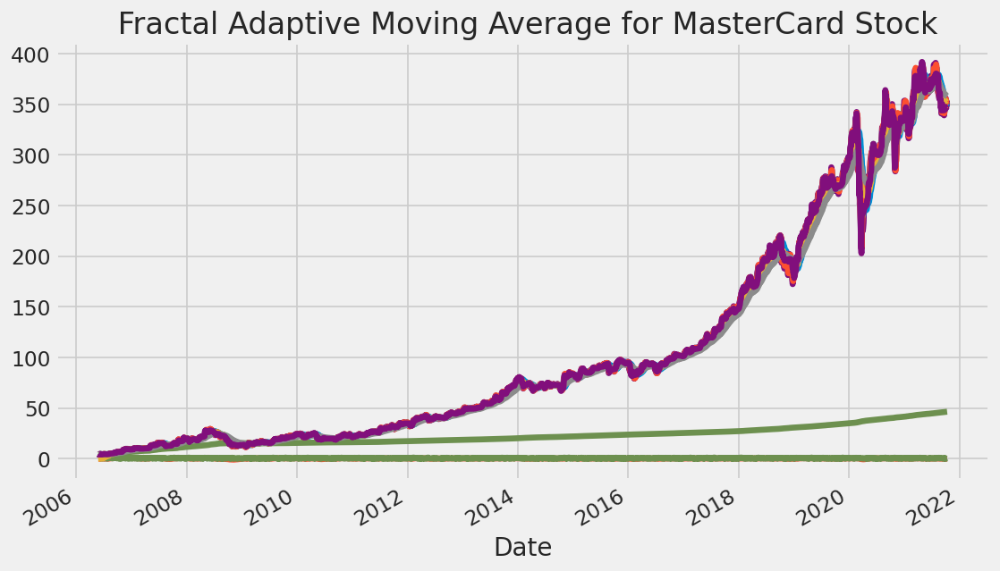

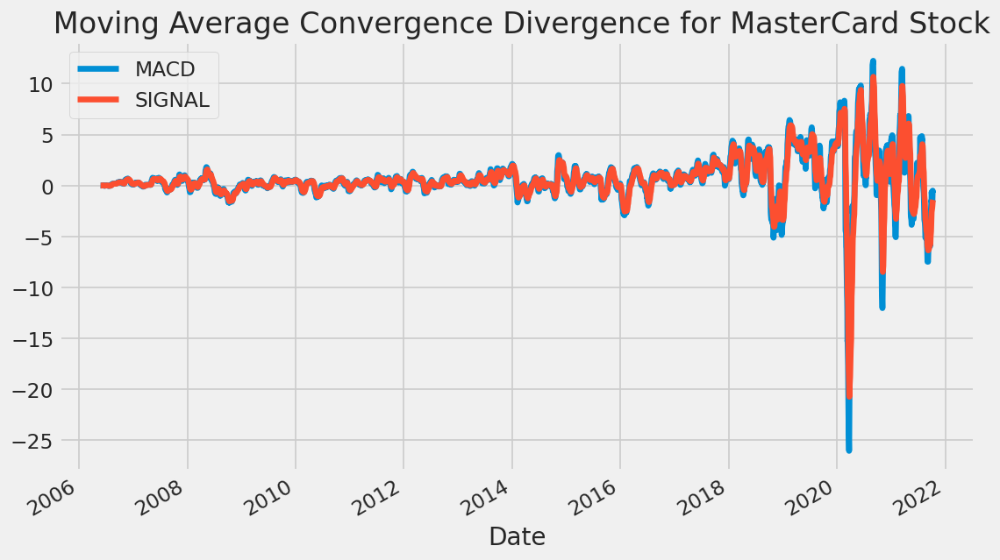

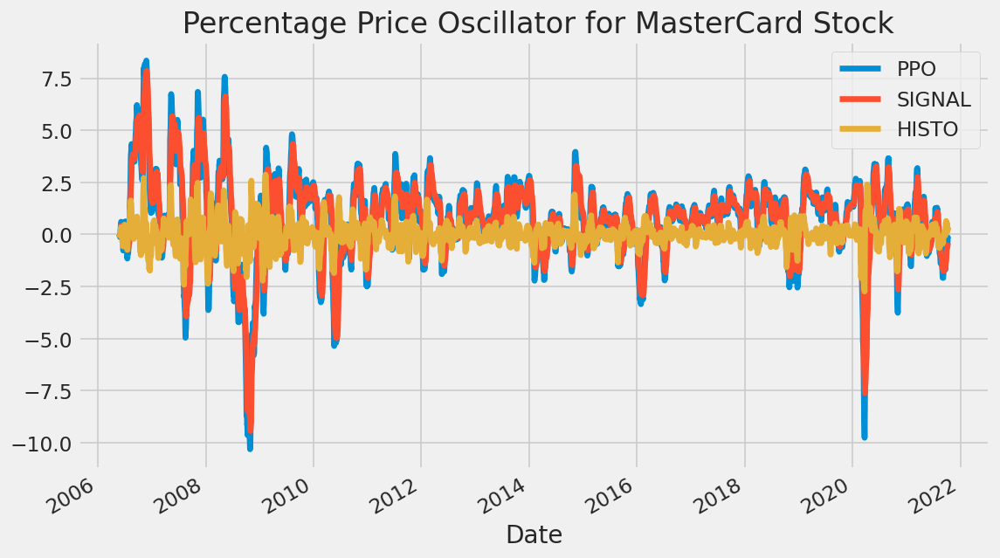

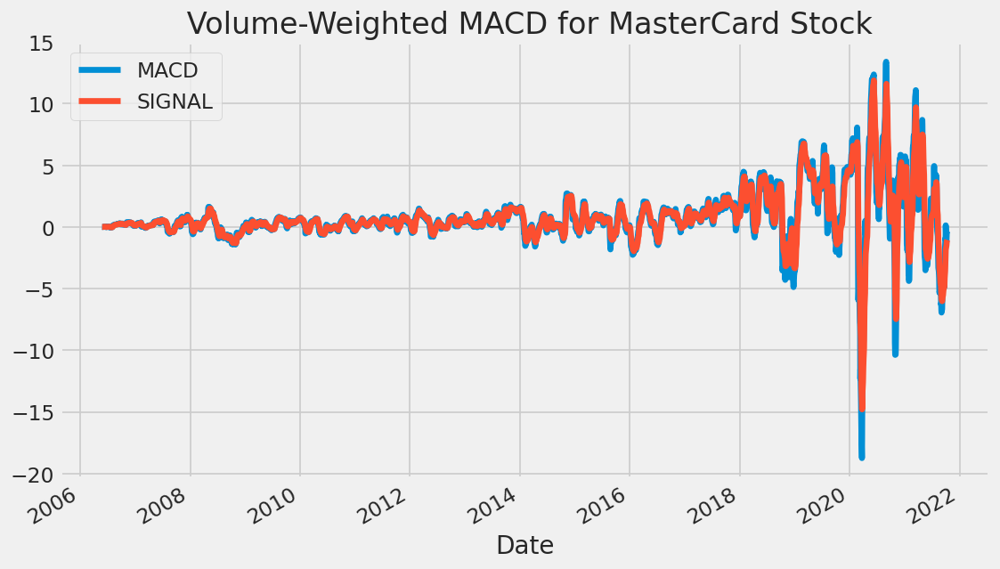

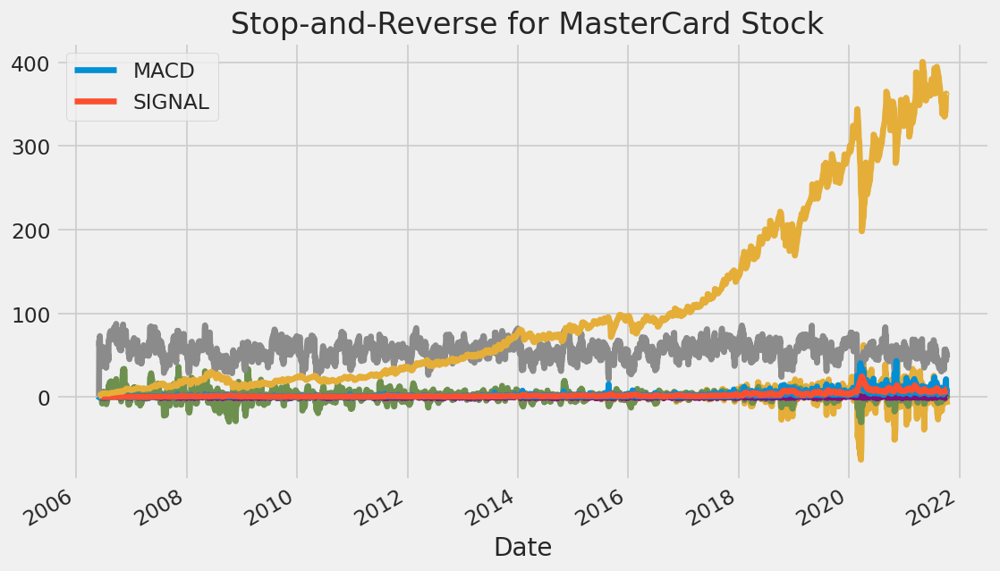

...

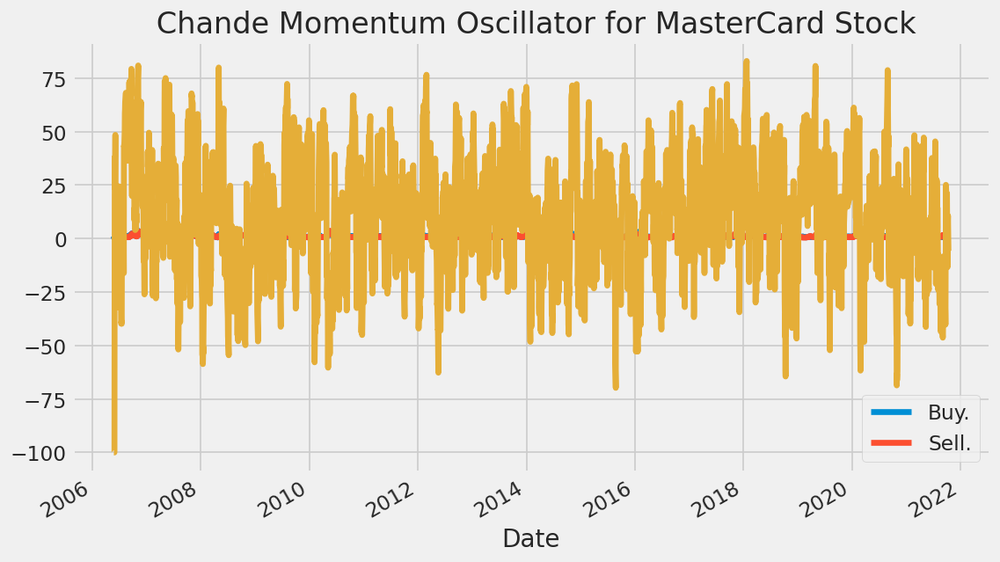

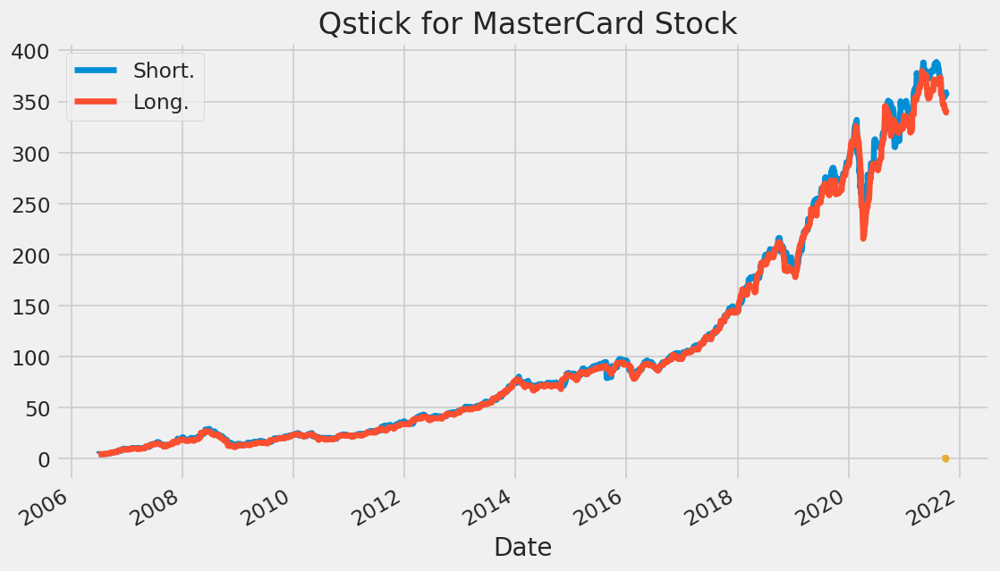

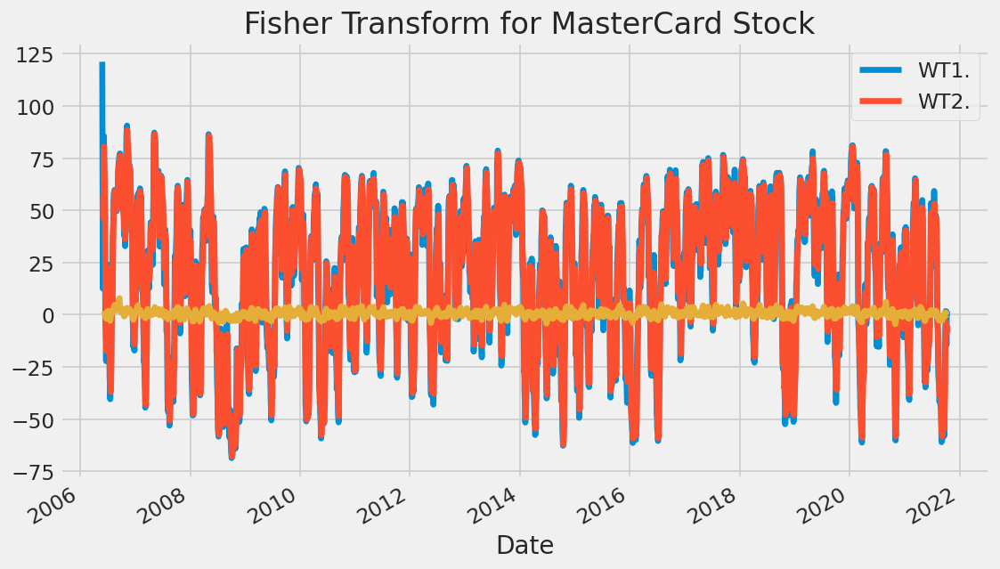

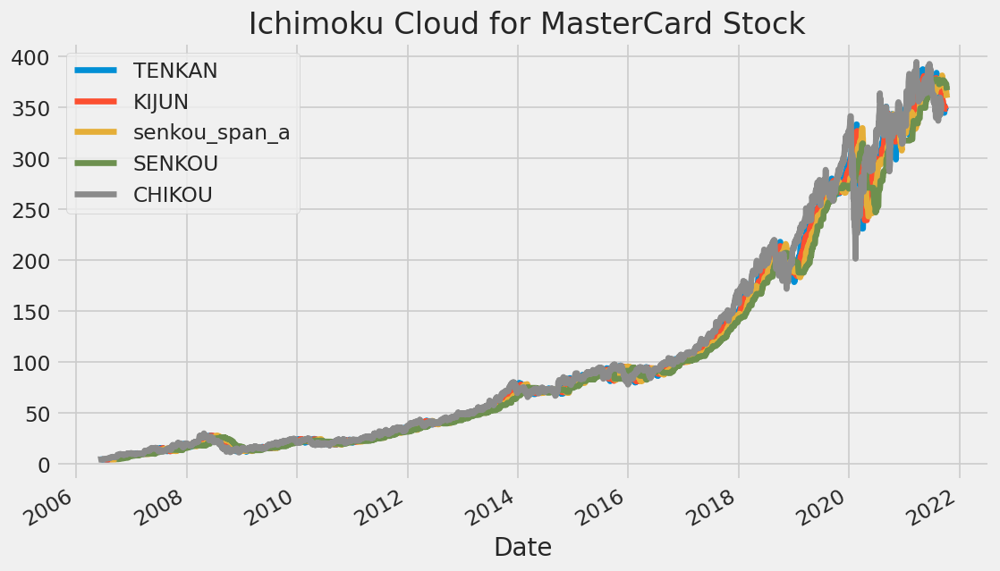

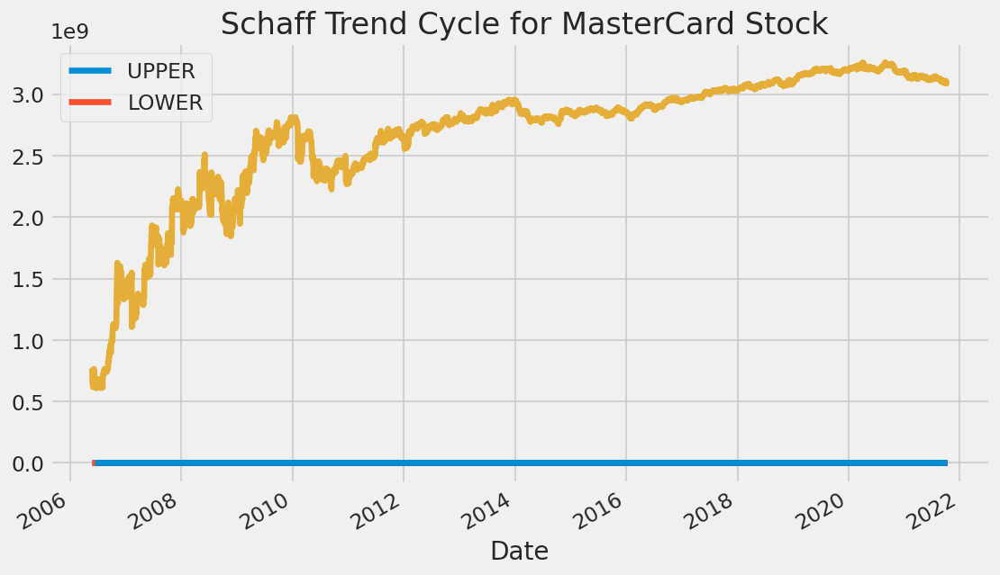

In [61]:
function_dict = {' Simple Moving Average ' : 'SMA',
                 ' Simple Moving Median ' : 'SMM',
                 ' Smoothed Simple Moving Average ' : 'SSMA',
                 ' Exponential Moving Average ' : 'EMA',
                 ' Double Exponential Moving Average ' : 'DEMA',
                 ' Triple Exponential Moving Average ' : 'TEMA',
                 ' Triangular Moving Average ' : 'TRIMA',
                 ' Triple Exponential Moving Average Oscillator ' : 'TRIX',
                 ' Volume Adjusted Moving Average ' : 'VAMA',
                 ' Kaufman Efficiency Indicator ' : 'ER',
                 ' Kaufmans Adaptive Moving Average ' : 'KAMA',
                 ' Zero Lag Exponential Moving Average ' : 'ZLEMA',
                 ' Weighted Moving Average ' : 'WMA',
                 ' Hull Moving Average ' : 'HMA',
                 ' Elastic Volume Moving Average ' : 'EVWMA',
                 ' Volume Weighted Average Price ' : 'VWAP',
                 ' Smoothed Moving Average ' : 'SMMA',
                 ' Fractal Adaptive Moving Average ' : 'FRAMA',
                 ' Moving Average Convergence Divergence ' : 'MACD',
                 ' Percentage Price Oscillator ' : 'PPO',
                 ' Volume-Weighted MACD ' : 'VW_MACD',
                 ' Elastic-Volume weighted MACD ' : 'EV_MACD',
                 ' Market Momentum ' : 'MOM',
                 ' Rate-of-Change ' : 'ROC',
                 ' Relative Strength Index ' : 'RSI',
                 ' Inverse Fisher Transform RSI ' : 'IFT_RSI',
                 ' True Range ' : 'TR',
                 ' Average True Range ' : 'ATR',
                 ' Stop-and-Reverse ' : 'SAR',
                 ' Bollinger Bands ' : 'BBANDS',
                 ' Bollinger Bands Width ' : 'BBWIDTH',
                 ' Momentum Breakout Bands ' : 'MOBO',
                 ' Percent B ' : 'PERCENT_B',
                 ' Keltner Channels ' : 'KC',
                 ' Donchian Channel ' : 'DO',
                 ' Directional Movement Indicator ' : 'DMI',
                 ' Average Directional Index ' : 'ADX',
                 ' Pivot Points ' : 'PIVOT',
                 ' Fibonacci Pivot Points ' : 'PIVOT_FIB',
                 ' Stochastic Oscillator Percent K ' : 'STOCH',
                 ' Stochastic oscillator Percent D ' : 'STOCHD',
                 ' Stochastic RSI ' : 'STOCHRSI',
                 ' Williams Percent R ' : 'WILLIAMS',
                 ' Ultimate Oscillator ' : 'UO',
                 ' Awesome Oscillator ' : 'AO',
                 ' Mass Index ' : 'MI',
                 ' Vortex Indicator ' : 'VORTEX',
                 ' Know Sure Thing ' : 'KST',
                 ' True Strength Index ' : 'TSI',
                 ' Typical Price ' : 'TP',
                 ' Accumulation-Distribution Line ' : 'ADL',
                 ' Chaikin Oscillator ' : 'CHAIKIN',
                 ' Money Flow Index ' : 'MFI',
                 ' On Balance Volume ' : 'OBV',
                 ' Weighter OBV ' : 'WOBV',
                 ' Volume Zone Oscillator ' : 'VZO',
                 ' Price Zone Oscillator ' : 'PZO',
                 ' Elders Force Index ' : 'EFI',
                 ' Cummulative Force Index ' : 'CFI',
                 ' Bull power and Bear Power ' : 'EBBP',
                 ' Ease of Movement ' : 'EMV',
                 ' Commodity Channel Index ' : 'CCI',
                 ' Coppock Curve ' : 'COPP',
                 ' Buy and Sell Pressure ' : 'BASP',
                 ' Normalized BASP ' : 'BASPN',
                 ' Chande Momentum Oscillator ' : 'CMO',
                 ' Chandelier Exit ' : 'CHANDELIER',
                 ' Qstick ' : 'QSTICK',
                 #' Twiggs Money Index ' : 'TMF',
                 ' Wave Trend Oscillator ' : 'WTO',
                 ' Fisher Transform ' : 'FISH',
                 ' Ichimoku Cloud ' : 'ICHIMOKU',
                 ' Adaptive Price Zone ' : 'APZ',
                 #' Squeeze Momentum Indicator ' : 'SQZMI',
                 ' Volume Price Trend ' : 'VPT',
                 ' Finite Volume Element ' : 'FVE',
                 ' Volume Flow Indicator ' : 'VFI',
                 ' Moving Standard deviation ' : 'MSD',
                 ' Schaff Trend Cycle ' : 'STC'}

for key, value in function_dict .items():
    function_name = "TA." + value + "(ohlc).plot(title='" + key + "for MasterCard Stock')"
    result = eval(function_name)


In [62]:
# Defining DEMA cross strategy
class DemaCross(Strategy):

    def init(self):

        self.ma1 = self.I(TA.DEMA, ohlc, 10)
        self.ma2 = self.I(TA.DEMA, ohlc, 20)

    def next(self):
        if crossover(self.ma1, self.ma2):
            self.buy()
        elif crossover(self.ma2, self.ma1):
            self.sell()

In [63]:
bt = Backtest(ohlc, DemaCross,
              cash=100000, commission=0.015, exclusive_orders=True)

In [64]:
bt.run()

Start                     2006-05-25 00:00:00
End                       2021-10-11 00:00:00
Duration                   5618 days 00:00:00
Exposure Time [%]                   73.295455
Equity Final [$]                   128.498859
Equity Peak [$]                 115881.039112
Return [%]                         -99.871501
Buy & Hold Return [%]             8012.464831
Return (Ann.) [%]                  -35.160521
Volatility (Ann.) [%]               20.170238
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                  -99.889373
Avg. Drawdown [%]                  -25.653566
Max. Drawdown Duration     5484 days 00:00:00
Avg. Drawdown Duration     1122 days 00:00:00
# Trades                                  244
Win Rate [%]                         22.95082
Best Trade [%]                      21.503467
Worst Trade [%]                    -30.067069
Avg. Trade [%]                    

In [65]:
bt.plot()

GridPlot(id='p1325', ...)

In [66]:
import numpy as np


def get_X(data):
    """Return model design matrix X"""
    return data.filter(like='X').values


def get_y(data):
    """Return dependent variable y"""
    y = data.Close.pct_change(48).shift(-48)  # Returns after roughly two days
    y[y.between(-.004, .004)] = 0             # Devalue returns smaller than 0.4%
    y[y > 0] = 1
    y[y < 0] = -1
    return y


def get_clean_Xy(df):
    """Return (X, y) cleaned of NaN values"""
    X = get_X(df)
    y = get_y(df).values
    isnan = np.isnan(y)
    X = X[~isnan]
    y = y[~isnan]
    return X, y

In [67]:
data=ohlc

In [68]:
from backtesting.test import SMA

def BBANDS(data, n_lookback, n_std):
    """Bollinger bands indicator"""
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean, std = hlc3.rolling(n_lookback).mean(), hlc3.rolling(n_lookback).std()
    upper = mean + n_std*std
    lower = mean - n_std*std
    return upper, lower


close = data.Close.values
sma10 = SMA(data.Close, 10)
sma20 = SMA(data.Close, 20)
sma50 = SMA(data.Close, 50)
sma100 = SMA(data.Close, 100)
upper, lower = BBANDS(data, 20, 2)

# Design matrix / independent features:

# Price-derived features
data['X_SMA10'] = (close - sma10) / close
data['X_SMA20'] = (close - sma20) / close
data['X_SMA50'] = (close - sma50) / close
data['X_SMA100'] = (close - sma100) / close

data['X_DELTA_SMA10'] = (sma10 - sma20) / close
data['X_DELTA_SMA20'] = (sma20 - sma50) / close
data['X_DELTA_SMA50'] = (sma50 - sma100) / close

# Indicator features
data['X_MOM'] = data.Close.pct_change(periods=2)
data['X_BB_upper'] = (upper - close) / close
data['X_BB_lower'] = (lower - close) / close
data['X_BB_width'] = (upper - lower) / close
data['X_Sentiment'] = ~data.index.to_series().between('2017-09-27', '2017-12-14')

# Some datetime features for good measure
data['X_day'] = data.index.dayofweek
data['X_hour'] = data.index.hour

#data = data.apply(pd.to_numeric)
#data = data.dropna().astype(np.float64)
#data.fillna(method="ffill")
#data =data[~data.isin([np.nan, np.inf, -np.inf]).any(1)]

#data.replace([np.inf, -np.inf], 0.0, inplace=True)
#data = data.fillna(data.mean(), inplace=True)
data = data.dropna().astype(np.float64)

Classification accuracy:  0.6859903381642513


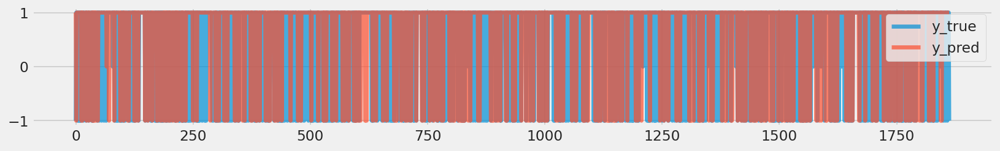

In [69]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

X, y = get_clean_Xy(data)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.5, random_state=0)

clf = KNeighborsClassifier(7)  # Model the output based on 7 "nearest" examples
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

_ = pd.DataFrame({'y_true': y_test, 'y_pred': y_pred}).plot(figsize=(15, 2), alpha=.7)
print('Classification accuracy: ', np.mean(y_test == y_pred))

In [70]:
%%time

from backtesting import Backtest, Strategy

N_TRAIN = 400


class MLTrainOnceStrategy(Strategy):
    price_delta = .004  # 0.4%

    def init(self):
        # Init our model, a kNN classifier
        self.clf = KNeighborsClassifier(7)

        # Train the classifier in advance on the first N_TRAIN examples
        df = self.data.df.iloc[:N_TRAIN]
        X, y = get_clean_Xy(df)
        self.clf.fit(X, y)

        # Plot y for inspection
        self.I(get_y, self.data.df, name='y_true')

        # Prepare empty, all-NaN forecast indicator
        self.forecasts = self.I(lambda: np.repeat(np.nan, len(self.data)), name='forecast')

    def next(self):
        # Skip the training, in-sample data
        if len(self.data) < N_TRAIN:
            return

        # Proceed only with out-of-sample data. Prepare some variables
        high, low, close = self.data.High, self.data.Low, self.data.Close
        current_time = self.data.index[-1]

        # Forecast the next movement
        X = get_X(self.data.df.iloc[-1:])
        forecast = self.clf.predict(X)[0]

        # Update the plotted "forecast" indicator
        self.forecasts[-1] = forecast

        # If our forecast is upwards and we don't already hold a long position
        # place a long order for 20% of available account equity. Vice versa for short.
        # Also set target take-profit and stop-loss prices to be one price_delta
        # away from the current closing price.
        upper, lower = close[-1] * (1 + np.r_[1, -1]*self.price_delta)

        if forecast == 1 and not self.position.is_long:
            self.buy(size=.2, tp=upper, sl=lower)
        elif forecast == -1 and not self.position.is_short:
            self.sell(size=.2, tp=lower, sl=upper)

        # Additionally, set aggressive stop-loss on trades that have been open
        # for more than two days
        for trade in self.trades:
            if current_time - trade.entry_time > pd.Timedelta('2 days'):
                if trade.is_long:
                    trade.sl = max(trade.sl, low)
                else:
                    trade.sl = min(trade.sl, high)


bt = Backtest(data, MLTrainOnceStrategy, commission=.0002, margin=.05)
bt.run()

CPU times: user 9.76 s, sys: 54 ms, total: 9.82 s
Wall time: 10.2 s


Start                     2006-10-16 00:00:00
End                       2021-10-11 00:00:00
Duration                   5474 days 00:00:00
Exposure Time [%]                   13.861649
Equity Final [$]                     4.558307
Equity Peak [$]                       10000.0
Return [%]                         -99.954417
Buy & Hold Return [%]              5127.08347
Return (Ann.) [%]                   -40.18084
Volatility (Ann.) [%]                10.83635
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                  -99.954417
Avg. Drawdown [%]                  -99.954417
Max. Drawdown Duration     4893 days 00:00:00
Avg. Drawdown Duration     4893 days 00:00:00
# Trades                                  523
Win Rate [%]                         6.118547
Best Trade [%]                       0.671689
Worst Trade [%]                     -5.997233
Avg. Trade [%]                    

In [71]:
bt.plot()

GridPlot(id='p1751', ...)

In [72]:
from backtesting import Strategy
from backtesting.lib import crossover


class Sma4Cross(Strategy):
    n1 = 50
    n2 = 100
    n_enter = 20
    n_exit = 10

    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
        self.sma_enter = self.I(SMA, self.data.Close, self.n_enter)
        self.sma_exit = self.I(SMA, self.data.Close, self.n_exit)

    def next(self):

        if not self.position:

            # On upwards trend, if price closes above
            # "entry" MA, go long

            # Here, even though the operands are arrays, this
            # works by implicitly comparing the two last values
            if self.sma1 > self.sma2:
                if crossover(self.data.Close, self.sma_enter):
                    self.buy()

            # On downwards trend, if price closes below
            # "entry" MA, go short

            else:
                if crossover(self.sma_enter, self.data.Close):
                    self.sell()

        # But if we already hold a position and the price
        # closes back below (above) "exit" MA, close the position

        else:
            if (self.position.is_long and
                crossover(self.sma_exit, self.data.Close)
                or
                self.position.is_short and
                crossover(self.data.Close, self.sma_exit)):

                self.position.close()

In [73]:
%%time

from backtesting import Backtest
from backtesting.test import GOOG


backtest = Backtest(ohlc, Sma4Cross, commission=.002)

stats, heatmap = backtest.optimize(
    n1=range(10, 110, 10),
    n2=range(20, 210, 20),
    n_enter=range(15, 35, 5),
    n_exit=range(10, 25, 5),
    constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Equity Final [$]',
    max_tries=200,
    random_state=0,
    return_heatmap=True)

Backtest.optimize:   0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 813 ms, sys: 126 ms, total: 939 ms
Wall time: 37.2 s


In [74]:
heatmap

n1   n2   n_enter  n_exit
20   60   15       10        10200.609296
     80   15       10        15245.851028
     100  15       10        16201.321646
30   40   20       15         9160.646086
          25       15         5373.420829
                                 ...     
100  200  15       10        12138.719723
          20       10        10075.892860
                   15         7977.940949
          25       10         7643.537558
          30       10         2818.509311
Name: Equity Final [$], Length: 177, dtype: float64

In [75]:
hm = heatmap.groupby(['n1', 'n2']).mean().unstack()
hm

n2,40,60,80,100,120,140,160,180,200
n1,,,,,,,,,
20,NaN,10200.609296,15245.851028,16201.321646,NaN,NaN,NaN,NaN,NaN
30,7267.033457,10603.816652,10381.363852,8416.304447,9581.176706,12472.612759,11020.062093,9251.042704,9669.130290
40,NaN,5356.778899,NaN,2780.543482,5074.166692,10830.097415,11234.717465,7765.270577,8463.862146
50,NaN,3691.001056,6250.000624,8602.531990,7019.923859,11148.309972,7950.716644,6106.165477,7640.429813
60,NaN,NaN,11158.235004,6228.199688,6610.270771,8869.100296,6789.737401,10375.875908,6415.360760
70,NaN,NaN,11670.658818,4012.798384,6556.402758,14390.044046,10233.943321,9373.768372,8286.829472
80,NaN,NaN,NaN,11469.578904,6234.678280,8357.580876,9595.741152,9312.299634,8974.881162
90,NaN,NaN,NaN,4515.885664,5898.788489,9282.830704,12949.704989,15544.217820,8808.125494
100,NaN,NaN,NaN,NaN,7214.829814,8496.398833,8205.549555,10269.024841,8130.920080


In [76]:
from backtesting.lib import plot_heatmaps


plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p2052', ...)